# Algorithmic Trading Model for Cramer COVID-19 Index Using Python Take 2
### David Lowe
### June 1, 2020

SUMMARY: The purpose of this project is to construct and test an algorithmic trading model and document the end-to-end steps using a template.

INTRODUCTION: CNBC’s Jim Cramer, the host of Mad Money show, presented a list of stocks on April 27th that he believes will work well in this coronavirus-plagued market. The ‘Cramer COVID-19 Index’ contains 100 companies that touch 17 sectors where investors can expect a positive return in this volatile market environment. The project aims to analyze these 100 stocks and develop strategies for trading these stocks, either individually or in groups.

In iteration Take1, we constructed the necessary code segments for downloading and visualizing the index and the stocks. The script leveraged various data sources, both free and paid subscriptions, for pulling the required dataset together.

In this Take2 iteration, we will build on the previous analysis by constructing a dual moving-average crossover trading model (20-day and 50-day) and applying the model to the 100 stocks in the index. For each stock, we will identify the entry and exit dates starting January 1, 2019.

NOTE: This script calculates the index value by using the number of outstanding shares from each company. Such an approach may not match how CNBC calculates this index (https://www.cnbc.com/cramer-covid-19-stocks/). This script is for educational purposes only and does not constitute a recommendation for buying or selling any stock mentioned in this script.

ANALYSIS: Refer to the list of entry and exit points for each stock in the index under Task 3.

CONCLUSION: Refer to the list of entry and exit points for each stock in the index under Task 3.

Dataset ML Model: Time series analysis with numerical attributes

Dataset Used: IEX Cloud and Quandl

An algorithmic trading modeling project generally can be broken down into about five major tasks:

1. Prepare Environment
2. Acquire and Pre-Process Data
3. Develop Strategy and Train Model
4. Back-test Model
5. Evaluate Performance

## Task 1. Prepare Environment

In [1]:
import os
import sys
import smtplib
import numpy as np
import pandas as pd
import requests
import json
from email.message import EmailMessage
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
from time import sleep
from dotenv import load_dotenv

In [2]:
# Define the function for sending the status notification emails
def email_notify(msg_text):
    sender = os.environ.get('MAIL_SENDER')
    receiver = os.environ.get('MAIL_RECEIVER')
    gateway = os.environ.get('SMTP_GATEWAY')
    smtpuser = os.environ.get('SMTP_USERNAME')
    password = os.environ.get('SMTP_PASSWORD')
    if (sender is None) or (receiver is None) or (gateway is None) or (smtpuser is None) or (password is None):
        sys.exit("Incomplete email setup info. Script Processing Aborted!!!")
    msg = EmailMessage()
    msg.set_content(msg_text)
    msg['Subject'] = 'Notification from Algorithmic Trading Modeling Script'
    msg['From'] = sender
    msg['To'] = receiver
    server = smtplib.SMTP(gateway, 587)
    server.starttls()
    server.login(smtpuser, password)
    server.send_message(msg)
    server.quit()

In [3]:
# Begin the timer for the script processing
startTimeScript = datetime.now()

# Set up the verbose flag to print detailed messages for debugging (setting True will activate!)
verbose = False

# Set up the sendNotification flag to send progress emails (setting True will send emails!)
notifyStatus = False

# Set up the parent directory location for loading the dotenv files
useColab = False
if useColab:
    # Mount Google Drive locally for storing files
    from google.colab import drive
    drive.mount('/content/gdrive')
    gdrivePrefix = '/content/gdrive/My Drive/Colab_Downloads/'
    env_path = '/content/gdrive/My Drive/Colab Notebooks/'
    dotenv_path = env_path + "python_script.env"
    load_dotenv(dotenv_path=dotenv_path)

# Set up the dotenv file for retrieving environment variables
useDocker = True
if not useDocker:
    env_path = "/Users/david/PycharmProjects/"
    dotenv_path = env_path + "python_script.env"
    load_dotenv(dotenv_path=dotenv_path)

# Configure the plotting style
plt.style.use('seaborn')

# Set Pandas options
pd.set_option("display.max_rows", 120)
pd.set_option("display.width", 140)

In [4]:
if notifyStatus: email_notify("Task 1. Prepare Environment has begun! "+datetime.now().strftime('%a %B %d, %Y %I:%M:%S %p'))

In [5]:
# Check and see whether the API key is available
alphavantage_key = os.environ.get('ALPHAVANTAGE_API')
if alphavantage_key is None: sys.exit("API key for Alpha Vantage not available. Script Processing Aborted!!!")

# Check and see whether the API key is available
iexcloud_key = os.environ.get('IEXCLOUD_API')
if iexcloud_key is None: sys.exit("API key for IEX Cloud not available. Script Processing Aborted!!!")

# Check and see whether the API key is available
quandl_key = os.environ.get('QUANDL_API')
if quandl_key is None: sys.exit("API key for Quandl not available. Script Processing Aborted!!!")

In [6]:
# Specify the parameters for the trading strategy
fast_ma = 20
slow_ma = 50

model_start_date = datetime(2019, 1, 1)
print("Starting date for the model:", model_start_date)
stock_start_date = model_start_date - timedelta(days=int(slow_ma*1.5)) # Need more pricing data to calculate moving averages

# model_end_date = datetime(2020, 1, 1)
model_end_date = datetime.now()
print("Ending date for the model:", model_end_date)

Starting date for the model: 2019-01-01 00:00:00
Ending date for the model: 2020-05-29 22:46:41.852454


In [7]:
if notifyStatus: email_notify("Task 1. Prepare Environment completed! "+datetime.now().strftime('%a %B %d, %Y %I:%M:%S %p'))

## Task 2. Acquire and Pre-Process Data

In [8]:
if notifyStatus: email_notify("Task 2. Acquire and Pre-Process Data has begun! "+datetime.now().strftime('%a %B %d, %Y %I:%M:%S %p'))

In [9]:
dataset_path = 'https://www.dainesanalytics.com/datasets/cramer-covid19-index/Cramer_COVID-19_Index.csv'
stockIndex = pd.read_csv(dataset_path, sep=',')
stockIndex.set_index('Symbol', inplace=True)
stockIndex = stockIndex.sort_index(ascending = True)

# Take a peek at the dataframe after import
stockIndex.head(10)

,Name
Symbol,
AAPL,Apple
ABBV,AbbVie
ABT,Abbott Labs
ADBE,Adobe
AKAM,Akamai Technologies
AMD,Advanced Micro Devices
AMT,American Tower
AMZN,Amazon
ATVI,Activision Blizzard


In [10]:
stock_list = stockIndex.index.tolist()
if verbose: print('Stocks to process:', stock_list)

In [11]:
for ticker in stock_list:
    iexcloud_url = "https://cloud.iexapis.com/stable/stock/%s/stats/sharesOutstanding?token=%s" % (ticker, iexcloud_key)
    sleep(1)
    response = requests.get(iexcloud_url)
    share_data = json.loads(response.text)
    stockIndex.loc[ticker,'Share_Outstanding'] = share_data
    print('Company outstanding share number retrieved for', ticker, ':', share_data)

Company outstanding share number retrieved for AAPL : 4334340000
Company outstanding share number retrieved for ABBV : 1762340000
Company outstanding share number retrieved for ABT : 1768850000
Company outstanding share number retrieved for ADBE : 481801000
Company outstanding share number retrieved for AKAM : 162274000
Company outstanding share number retrieved for AMD : 1171190000
Company outstanding share number retrieved for AMT : 443306000
Company outstanding share number retrieved for AMZN : 498776000
Company outstanding share number retrieved for ATVI : 770486000
Company outstanding share number retrieved for BAX : 508836000
Company outstanding share number retrieved for BNTX : 228604644
Company outstanding share number retrieved for BSX : 1399350000
Company outstanding share number retrieved for BYND : 62236700
Company outstanding share number retrieved for CAG : 487076000
Company outstanding share number retrieved for CCI : 416751000
Company outstanding share number retrieved 

In [12]:
stockIndex.head(10)

,Name,Share_Outstanding
Symbol,,
AAPL,Apple,4.334340e+09
ABBV,AbbVie,1.762340e+09
ABT,Abbott Labs,1.768850e+09
ADBE,Adobe,4.818010e+08
AKAM,Akamai Technologies,1.622740e+08
AMD,Advanced Micro Devices,1.171190e+09
AMT,American Tower,4.433060e+08
AMZN,Amazon,4.987760e+08
ATVI,Activision Blizzard,7.704860e+08


In [13]:
total_shares = stockIndex['Share_Outstanding'].sum()

In [14]:
# Create the master dataframe to hold the index and individual stock data
date_index = pd.date_range(start=stock_start_date, end=model_end_date)
columns = ['JC_MAD']
index_df = pd.DataFrame(index=date_index, columns=columns)
index_df = index_df.fillna(0.0)
index_df.head()

,JC_MAD
2018-10-18,0.0
2018-10-19,0.0
2018-10-20,0.0
2018-10-21,0.0
2018-10-22,0.0


In [15]:
# Create the master dataframe to hold the index and individual stock data
stock_df = pd.DataFrame(index=date_index)
stock_df.head()

""
2018-10-18
2018-10-19
2018-10-20
2018-10-21
2018-10-22


In [16]:
start_date_string = stock_start_date.strftime('%Y-%m-%d')
end_date_string = model_end_date.strftime('%Y-%m-%d')

for ticker in stock_list:
    quandl_url = "https://www.quandl.com/api/v3/datatables/SHARADAR/SEP.json?date.gte=%s&date.lte=%s&ticker=%s&api_key=%s" % (start_date_string, end_date_string, ticker, quandl_key)
    response = requests.get(quandl_url)
    sleep(1)
    quandl_dict = json.loads(response.text)
    stock_data = pd.DataFrame(quandl_dict['datatable']['data'])
    print(len(stock_data), 'data points retrieved from the API call for:', ticker)
    stock_data.columns = ['ticker', 'date', 'open', 'high', 'low', 'close', 'volume', 'dividend', 'closeunadj', 'lastupdated']
    stock_data.index = pd.to_datetime(stock_data.date)
    stock_data = stock_data.sort_index(ascending = True)
    stock_close = stock_data.loc[:, ['closeunadj']]
    stock_close.rename(columns={'closeunadj': ticker}, inplace=True)
    stock_df = pd.concat([stock_df, stock_close], axis=1)
    component_close = stock_data.loc[:, ['closeunadj']] * stockIndex.loc[ticker, 'Share_Outstanding'] / total_shares
    component_close.rename(columns={'closeunadj': ticker}, inplace=True)
    index_df = pd.concat([index_df, component_close], axis=1)

index_df.dropna(inplace=True)
index_df['JC_MAD'] = index_df[stock_list].sum(axis=1)

405 data points retrieved from the API call for: AAPL
405 data points retrieved from the API call for: ABBV
405 data points retrieved from the API call for: ABT
405 data points retrieved from the API call for: ADBE
405 data points retrieved from the API call for: AKAM
405 data points retrieved from the API call for: AMD
405 data points retrieved from the API call for: AMT
405 data points retrieved from the API call for: AMZN
405 data points retrieved from the API call for: ATVI
405 data points retrieved from the API call for: BAX
160 data points retrieved from the API call for: BNTX
405 data points retrieved from the API call for: BSX
272 data points retrieved from the API call for: BYND
405 data points retrieved from the API call for: CAG
405 data points retrieved from the API call for: CCI
405 data points retrieved from the API call for: CHGG
242 data points retrieved from the API call for: CHWY
405 data points retrieved from the API call for: CL
405 data points retrieved from the AP

In [17]:
stock_df.head()

,AAPL,ABBV,ABT,ADBE,AKAM,AMD,AMT,AMZN,ATVI,BAX,...,UNH,VEEV,VZ,WING,WIX,WMT,WORK,ZM,ZS,ZTS
2018-10-18,216.02,89.90,68.14,250.35,64.50,26.62,146.79,1770.72,71.81,70.47,...,266.81,93.50,54.65,71.36,97.45,96.17,NaN,NaN,36.78,91.83
2018-10-19,219.31,87.97,67.59,245.03,64.24,23.66,150.15,1764.03,69.75,69.46,...,265.30,91.63,54.90,70.79,95.00,97.15,NaN,NaN,35.68,91.47
2018-10-20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-10-21,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-10-22,220.65,84.27,68.52,251.06,65.18,25.03,149.25,1789.30,69.78,69.02,...,262.19,91.62,54.98,70.16,97.98,97.14,NaN,NaN,36.30,92.80


In [18]:
stock_df.tail()

,AAPL,ABBV,ABT,ADBE,AKAM,AMD,AMT,AMZN,ATVI,BAX,...,UNH,VEEV,VZ,WING,WIX,WMT,WORK,ZM,ZS,ZTS
2020-05-25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-05-26,316.73,90.71,89.48,376.63,100.08,53.19,243.93,2421.86,70.00,85.51,...,294.89,195.12,54.30,118.99,209.76,123.86,32.41,164.00,76.52,130.45
2020-05-27,318.11,89.98,90.76,375.17,99.97,52.74,252.01,2410.39,70.15,86.44,...,303.77,191.99,55.14,119.86,205.96,122.48,32.11,161.97,74.53,135.64
2020-05-28,318.25,90.03,92.10,379.83,102.91,51.74,258.12,2401.10,70.22,88.20,...,303.97,204.20,55.72,119.07,207.40,123.69,32.54,163.55,75.80,138.11
2020-05-29,317.94,92.67,94.92,386.60,105.80,53.80,258.17,2442.37,71.98,90.01,...,304.85,218.87,57.38,121.95,222.33,124.06,35.05,179.48,98.09,139.39


In [19]:
index_df.head()

,JC_MAD,AAPL,ABBV,ABT,ADBE,AKAM,AMD,AMT,AMZN,ATVI,...,UNH,VEEV,VZ,WING,WIX,WMT,WORK,ZM,ZS,ZTS
2019-10-10,119.108355,13.672285,1.798766,1.943393,1.816307,0.198798,0.455680,1.375214,11.763052,0.567125,...,2.908888,0.277832,3.394141,0.035771,0.088123,4.646669,0.138946,0.163118,0.083879,0.829590
2019-10-11,119.983371,14.035945,1.778955,1.931026,1.838170,0.199221,0.477677,1.364092,11.842783,0.579061,...,2.887305,0.281067,3.399814,0.035954,0.088914,4.671144,0.151604,0.163899,0.085333,0.836492
2019-10-14,119.830417,14.015741,1.782096,1.935633,1.834801,0.199866,0.490201,1.371324,11.873622,0.581068,...,2.868062,0.283267,3.381093,0.035893,0.088772,4.629576,0.143612,0.162636,0.084234,0.824251
2019-10-15,121.034640,13.983059,1.799975,1.988013,1.845436,0.203181,0.493252,1.362633,12.085257,0.586877,...,3.102094,0.289256,3.434986,0.035860,0.088222,4.643561,0.144312,0.163348,0.082257,0.838055
2019-10-16,120.604866,13.926609,1.806015,1.983163,1.801247,0.202291,0.494697,1.349020,12.153978,0.587194,...,3.081292,0.277074,3.420237,0.036104,0.086964,4.639288,0.137896,0.155492,0.080953,0.832976


In [20]:
index_df.tail()

,JC_MAD,AAPL,ABBV,ABT,ADBE,AKAM,AMD,AMT,AMZN,ATVI,...,UNH,VEEV,VZ,WING,WIX,WMT,WORK,ZM,ZS,ZTS
2020-05-22,148.924160,18.948911,2.225203,2.218146,2.544732,0.223403,0.885831,1.473365,16.663264,0.771940,...,3.769736,0.375200,3.069080,0.049163,0.152023,4.830034,0.184969,0.392945,0.136441,0.847170
2020-05-26,147.511579,18.820561,2.191620,2.169888,2.487729,0.222647,0.854039,1.482481,16.560558,0.739406,...,3.834095,0.360706,3.080425,0.048258,0.148173,4.811775,0.189053,0.376727,0.135696,0.849384
2020-05-27,147.959211,18.902563,2.173983,2.200928,2.478085,0.222402,0.846814,1.531587,16.482127,0.740991,...,3.949550,0.354920,3.128078,0.048611,0.145489,4.758164,0.187303,0.372064,0.132167,0.883177
2020-05-28,148.842406,18.910882,2.175191,2.233423,2.508865,0.228943,0.830757,1.568721,16.418602,0.741730,...,3.952151,0.377492,3.160982,0.048291,0.146506,4.805171,0.189811,0.375693,0.134420,0.899260
2020-05-29,150.886399,18.892461,2.238975,2.301808,2.553583,0.235372,0.863833,1.569025,16.700805,0.760321,...,3.963592,0.404612,3.255153,0.049459,0.157053,4.819545,0.204452,0.412286,0.173948,0.907594


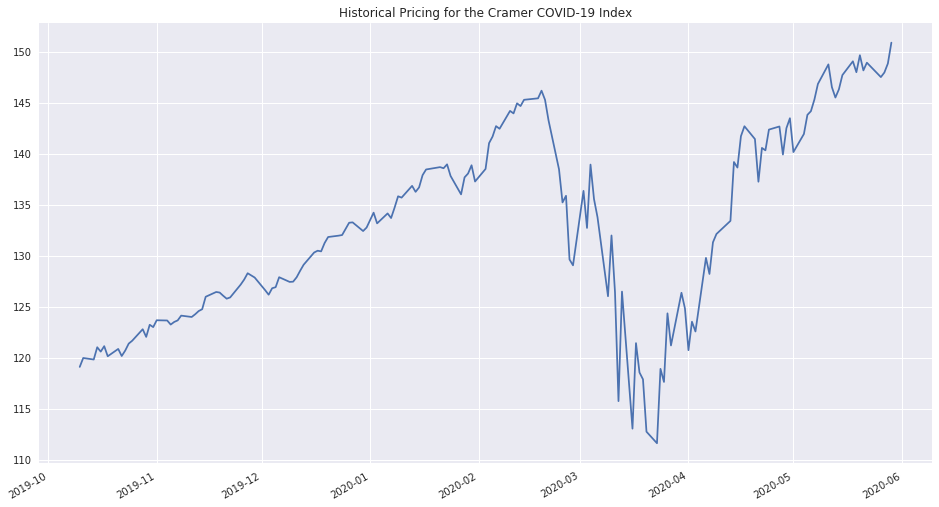

In [21]:
title_string = 'Historical Pricing for the Cramer COVID-19 Index'
index_df['JC_MAD'].plot(figsize=(16,9), title=title_string)
plt.show()

In [22]:
if notifyStatus: email_notify("Task 2. Acquire and Pre-Process Data completed! "+datetime.now().strftime('%a %B %d, %Y %I:%M:%S %p'))

## Task 3. Develop Strategy and Train Model

In [23]:
if notifyStatus: email_notify("Task 3. Develop Strategy and Train Model has begun! "+datetime.now().strftime('%a %B %d, %Y %I:%M:%S %p'))

In [24]:
def ma_crossover(data):
    wait_for_entry = True
    for x in range(len(data)):
        if data['ma_change'].iloc[x] > 0:
            data['signal'].iloc[x] = 1  # Signal = 1 means we should take a long position
        else:
            data['signal'].iloc[x] = 0  # Signal = 0 means we should not have a position
        if x != 0:
            data['signal_chg'].iloc[x] = data['signal'].iloc[x] - data['signal'].iloc[x-1]
            if wait_for_entry and (data['signal_chg'].iloc[x-1] == 1):
                data['entry_exit'].iloc[x] = data['signal_chg'].iloc[x-1]
                wait_for_entry = False
            elif (not wait_for_entry) and (data['signal_chg'].iloc[x-1] != 0):
                data['entry_exit'].iloc[x] = data['signal_chg'].iloc[x-1]

In [25]:
dataframe_collection = {}

for ticker in stock_list:
    print('Processing dataframe for ticker symbol:', ticker)
    dataframe_collection[ticker] = pd.DataFrame(stock_df[ticker])
    dataframe_collection[ticker].dropna(inplace=True)
    dataframe_collection[ticker].rename(columns={ticker: 'close'}, inplace=True)
    dataframe_collection[ticker]['fast_ma'] = dataframe_collection[ticker]['close'].rolling(fast_ma).mean()
    dataframe_collection[ticker]['slow_ma'] = dataframe_collection[ticker]['close'].rolling(slow_ma).mean()
    dataframe_collection[ticker]['ma_change'] = dataframe_collection[ticker]['fast_ma'] - dataframe_collection[ticker]['slow_ma']
    dataframe_collection[ticker]['signal'] = np.zeros(len(dataframe_collection[ticker]))
    dataframe_collection[ticker]['signal_chg'] = np.zeros(len(dataframe_collection[ticker]))
    dataframe_collection[ticker]['entry_exit'] = np.zeros(len(dataframe_collection[ticker]))
    dataframe_collection[ticker] = dataframe_collection[ticker][model_start_date:model_end_date]
    ma_crossover(dataframe_collection[ticker])

Processing dataframe for ticker symbol: AAPL
Processing dataframe for ticker symbol: ABBV
Processing dataframe for ticker symbol: ABT
Processing dataframe for ticker symbol: ADBE
Processing dataframe for ticker symbol: AKAM
Processing dataframe for ticker symbol: AMD
Processing dataframe for ticker symbol: AMT
Processing dataframe for ticker symbol: AMZN
Processing dataframe for ticker symbol: ATVI
Processing dataframe for ticker symbol: BAX
Processing dataframe for ticker symbol: BNTX
Processing dataframe for ticker symbol: BSX
Processing dataframe for ticker symbol: BYND
Processing dataframe for ticker symbol: CAG
Processing dataframe for ticker symbol: CCI
Processing dataframe for ticker symbol: CHGG
Processing dataframe for ticker symbol: CHWY
Processing dataframe for ticker symbol: CL
Processing dataframe for ticker symbol: CLX
Processing dataframe for ticker symbol: CMG
Processing dataframe for ticker symbol: CNC
Processing dataframe for ticker symbol: COR
Processing dataframe fo

In [26]:
for ticker in stock_list:
    print('List the signal change and entry/exit points for', ticker)
    print(dataframe_collection[ticker][(dataframe_collection[ticker].signal_chg != 0) | (dataframe_collection[ticker].entry_exit != 0)])
    print()

List the signal change and entry/exit points for AAPL
             close   fast_ma   slow_ma  ma_change  signal  signal_chg  entry_exit
2019-02-12  170.89  162.4450  161.6908     0.7542     1.0         1.0         0.0
2019-02-13  170.18  163.3005  161.5034     1.7971     1.0         0.0         1.0
2019-05-24  178.97  195.2160  195.7504    -0.5344     0.0        -1.0         0.0
2019-05-28  178.23  193.8970  195.5926    -1.6956     0.0         0.0        -1.0
2019-07-01  201.55  194.3815  194.0596     0.3219     1.0         1.0         0.0
2019-07-02  202.73  195.5360  194.0236     1.5124     1.0         0.0         1.0
2020-03-05  292.92  307.4485  307.6264    -0.1779     0.0        -1.0         0.0
2020-03-06  289.03  305.6395  307.7270    -2.0875     0.0         0.0        -1.0
2020-04-30  293.80  273.9600  271.0604     2.8996     1.0         1.0         0.0
2020-05-01  289.07  276.1670  270.4358     5.7312     1.0         0.0         1.0

List the signal change and entry/exit point

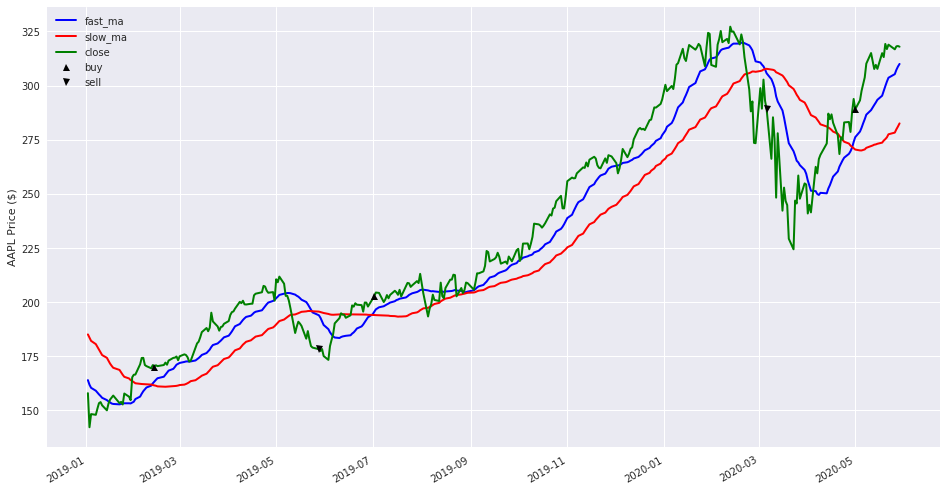

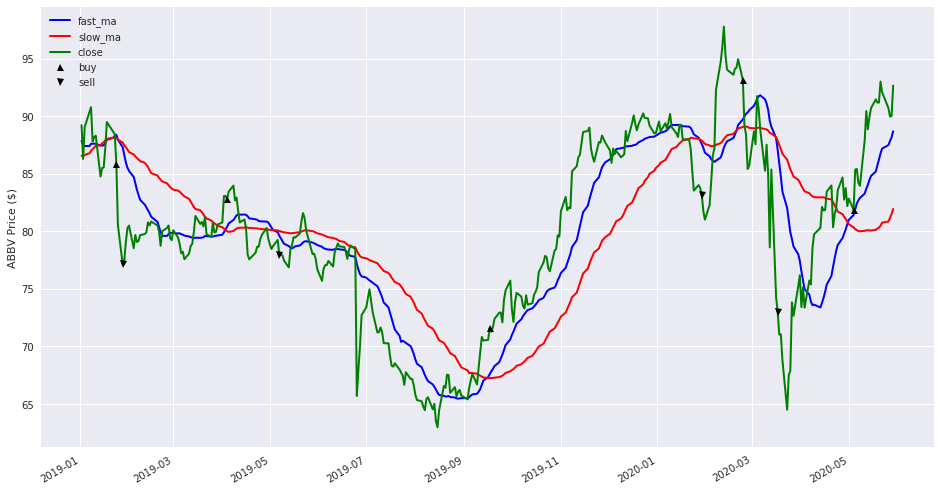

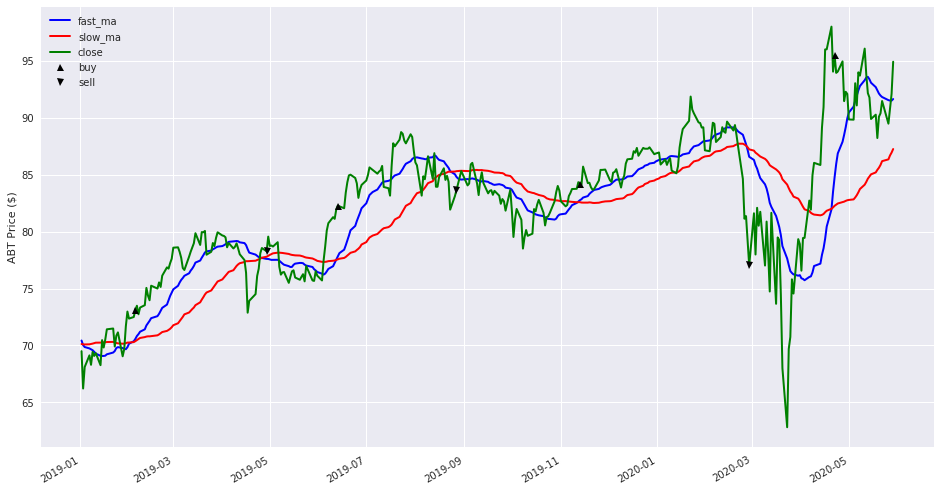

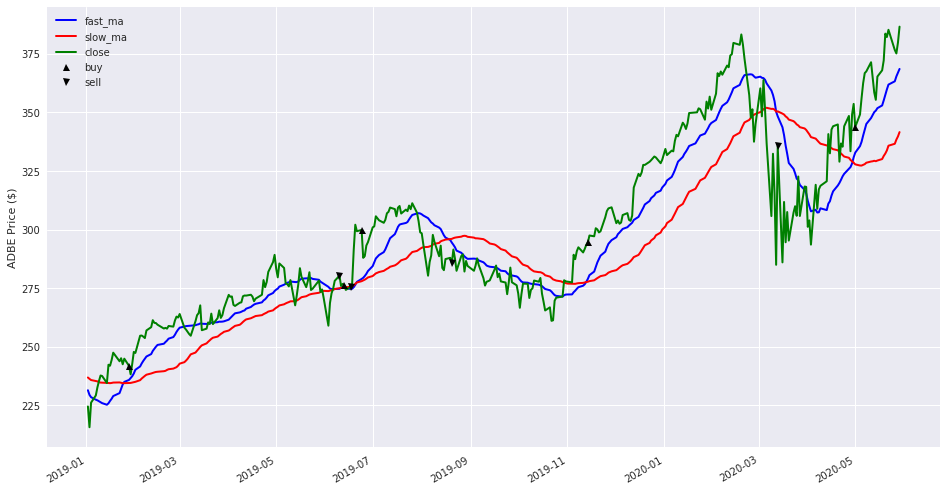

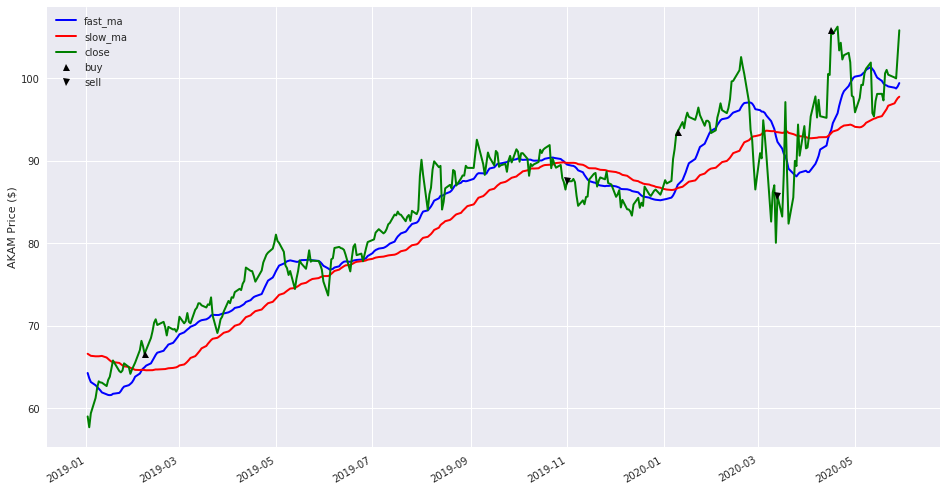

...

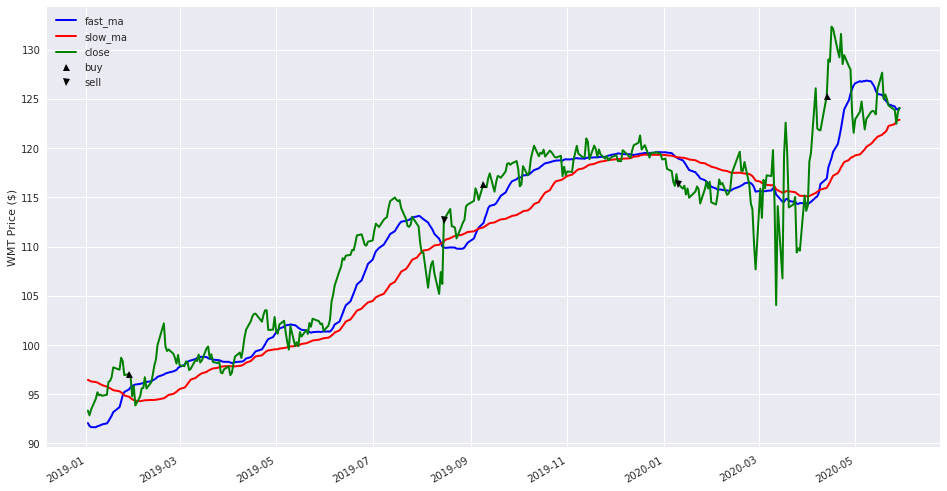

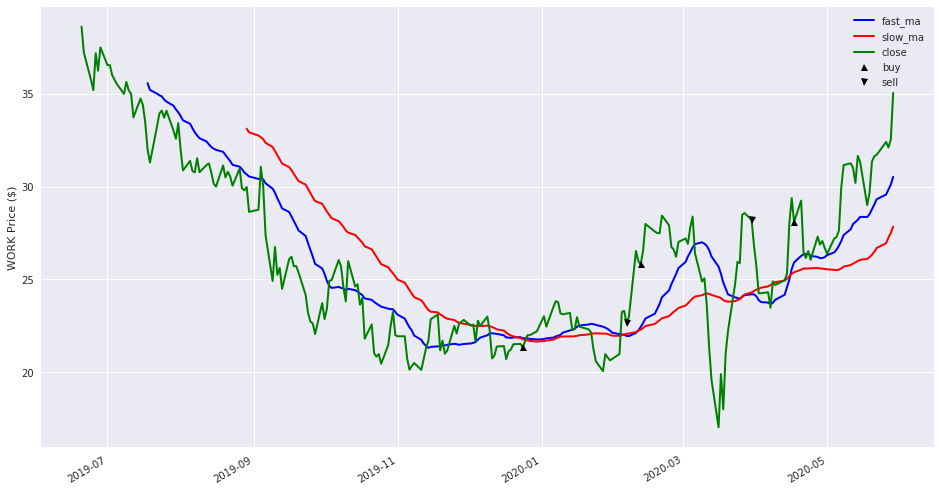

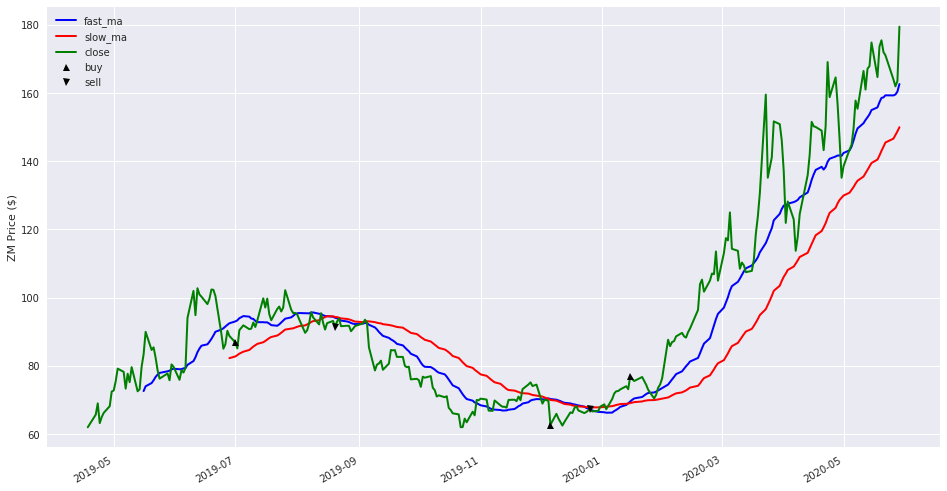

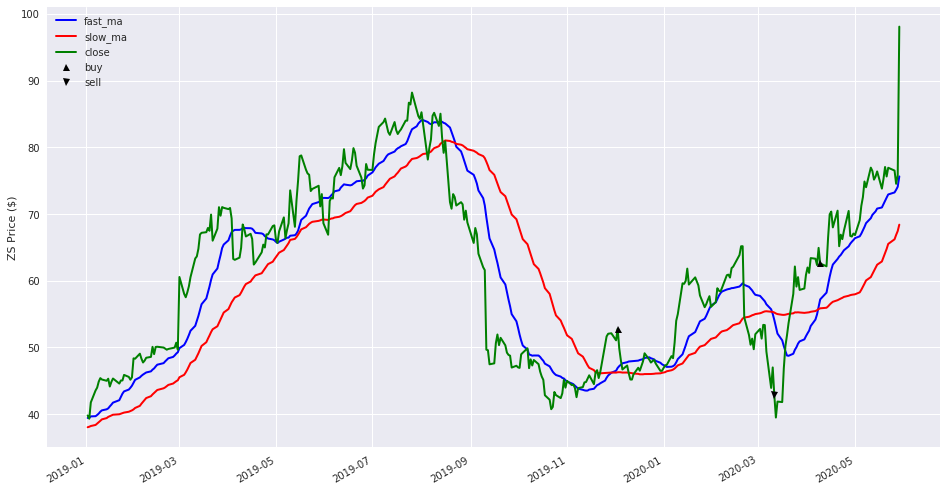

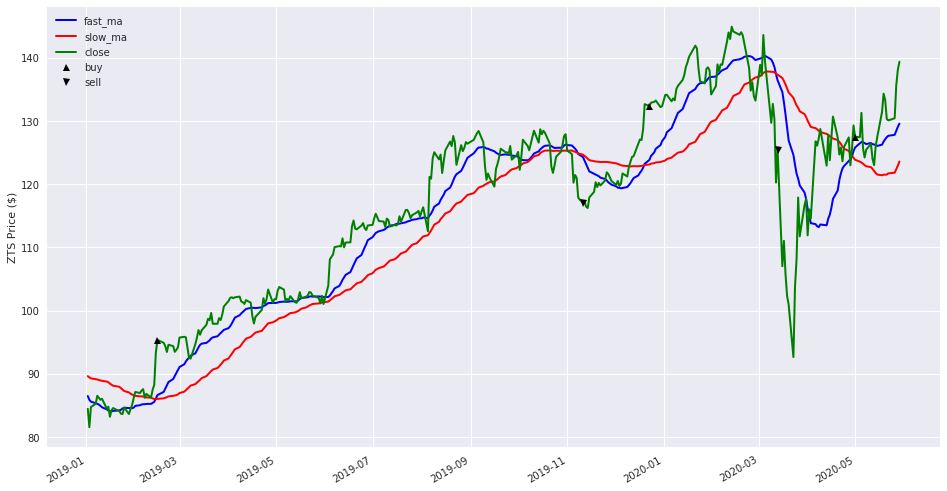

In [27]:
for ticker in stock_list:
    graph_data = dataframe_collection[ticker][:]
    fig = plt.figure(figsize=(16,9))
    ylabel = ticker + ' Price ($)'
    ax1 = fig.add_subplot(111, ylabel=ylabel)
    graph_data['fast_ma'].plot(ax=ax1, color='b', lw=2.)
    graph_data['slow_ma'].plot(ax=ax1, color='r', lw=2.)
    graph_data['close'].plot(ax=ax1, color='g', lw=2.)
    ax1.plot(graph_data.loc[graph_data.entry_exit == 1].index, graph_data.close[graph_data.entry_exit == 1], '^', markersize=7, color='k',label='buy')
    ax1.plot(graph_data.loc[graph_data.entry_exit == -1].index, graph_data.close[graph_data.entry_exit == -1], 'v', markersize=7, color='k',label='sell')
    plt.legend()
    plt.show()

In [28]:
if notifyStatus: email_notify("Task 3. Develop Strategy and Train Model completed! "+datetime.now().strftime('%a %B %d, %Y %I:%M:%S %p'))

## Task 4. Back-test Model

In [29]:
if notifyStatus: email_notify("Task 4. Back-test Model has begun! "+datetime.now().strftime('%a %B %d, %Y %I:%M:%S %p'))

In [30]:
# Not applicable for this iteration of the project

In [31]:
if notifyStatus: email_notify("Task 4. Back-test Model completed! "+datetime.now().strftime('%a %B %d, %Y %I:%M:%S %p'))

## Task 5. Evaluate Performance

In [32]:
if notifyStatus: email_notify("Task 5. Evaluate Performance has begun! "+datetime.now().strftime('%a %B %d, %Y %I:%M:%S %p'))

In [33]:
# Not applicable for this iteration of the project

In [34]:
if notifyStatus: email_notify("Task 5. Evaluate Performance completed! "+datetime.now().strftime('%a %B %d, %Y %I:%M:%S %p'))

In [35]:
print ('Total time for the script:',(datetime.now() - startTimeScript))

Total time for the script: 0:06:50.952676
